# Proyecto: Minimización con algoritmo de abejas a hiperparámetros de bosque aleatorio de clasificación 
**Hernández Jiménez Erick Yael 2023630748**
**Algortimos Bioinspirados de Ingeniería en Inteligencia Artificial 2025-1**
**Escuela Superior de Cómputo**
Descripción:
Este archivo `ipynb` implementa el algoritmo bio inspirado en abejas para minimizar los hiperparámetros que regulan el comportamiento de bosques aleatorios de clasificación para un conjunto de datos limpio y sin datos faltantes, usando particularmente [*agaricus-lepiota*](https://archive.ics.uci.edu/dataset/73/mushroom).

## Bibliotecas usadas

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from datetime import datetime
from pandas.core.frame import DataFrame
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree

## Generación de clase y algoritmo de abejas

In [2]:
def gain(values: list, dataset: DataFrame)->float:
    r'''
    - values: list -> [n_estimators, max_features, max_samples, max_depth, max_leaf_nodes]
    - dataset: DataFrame -> Conjunto de datos a evaluar
    '''
    # Consideraremos un promedio tanto de la evaluación con los datos de entrenamiento como de los datos de prueba
    bosque = RandomForestClassifier(criterion="gini", bootstrap=True, oob_score=True, n_estimators=values[0], max_features=values[1], max_samples=values[2], max_depth=values[3], max_leaf_nodes=values[4])
    bosque.fit(dataset.drop("class", axis=1), dataset["class"])
    score: float = bosque.score(dataset.drop("class", axis=1), dataset["class"])
    score += bosque.oob_score_
    score /= 2
    return score

# No se incluirá la función de peso en este caso, ya que no es necesario para el problema de clasificación
class Worker():
    def __init__(self, limits: list[tuple]):
        r'''
        Inicializa la trabajadora con la función `xij = lj + r*(uj - lj)`, el límite en 0 
        y reevalúa en caso de que el resultado de la exploración sobrepase el límite 
        de peso de la mochila.
        '''
        # Inicializa la fuente de comida
        self.content: list[int] = [int(d_min + np.random.rand()*(d_max - d_min)) if isinstance(d_min, int) else d_min + np.random.rand()*(d_max - d_min) for d_min, d_max in limits]
        # Inicializa el límite de la solución en 0
        self.limit = 0
        
    def __str__(self):
        return f"{self.content}"

class Hive():
    r'''
    Clase que almacena toda la colmena con las soluciones a la función.

    La implementación está aplicado concretamente para el problema de minimización de hiperparámetros 
    de clasificación con bosque aleatorio para cualquier conjunto de datos limpio. E inicializa a la 
    abeja más valiosa (mvb) como la primera generada.
    '''
    def __init__(self, p_size: int, limits: list[tuple], dataset: DataFrame):
        self.population: list[Worker] = [
            # Inicializamos la abeja con 7 variables
            Worker(limits) for _ in range(p_size//2)]
        self.mvb: list = self.population[0].content
        self.range: list[tuple] = limits
        self.dataset: DataFrame = dataset

    def __str__(self):
        result: str = ""
        for dbx, bee in enumerate(self.population):
            result += f"{f"[{dbx}]": >5} {bee}\n"
        return result
    
    def worker_iteration(self)->None:
        r'''
        Función que ejecuta el ciclo correspondiente a las abejas obreras
        '''
        for index in range(len(self.population)):
            # Índice para la variable a explotar
            j: int = np.random.randint(low = 0, high = len(self.population[0].content))
            # Índice para la solución a mejorar
            k: int = np.random.randint(low = 0, high = len(self.population) - 1)
            # Evasión de autoreferenciado
            while k == index:
                k = np.random.randint(low = 0, high = len(self.population) - 1)
            # Generación de random
            r: float = np.random.uniform(low = -1, high = 1)
            value_i_j: int | float = self.population[index].content[j]
            value_k_j: int | float = self.population[k].content[j]
            if isinstance(value_i_j, float):
                value_i_j_t= float(np.clip(value_i_j + r*(value_i_j - value_k_j), min = self.range[j][0], max = self.range[j][1]))
            elif isinstance(value_i_j, int):
                value_i_j_t = int(np.clip(int(value_i_j + r*(value_i_j - value_k_j)), min = self.range[j][0], max = self.range[j][1]))
            temp_bee: list = [temp if dx != j else value_i_j_t for dx, temp in enumerate(self.population[index].content)]
            
            original_gains: float = gain(self.population[index].content, self.dataset)*1_000_000
            new_gains: float = gain(temp_bee, self.dataset)*1_000_000
            
            #print(f"{self.population[index]} gains: {original_gains}")
            #print(f"{temp_bee} gains: {new_gains}")
            if new_gains >= original_gains:
                self.population[index].content = temp_bee
                self.population[index].limit = 0
            else:
                self.population[index].limit += 1
            #print(f"{self.population[index]}. Límite = {self.population[index].limit}")
            #print('*'*100, '\n')

    def roulette_sel(self)->tuple[int, Worker]:
        r'''
        Función que aplica el algoritmo de selección por ruleta con la población de la colmena
        '''
        # Inicializamos el fitness total en 0
        total_fitness: float = 0
        # Inicializamos la lista de probabilidades con el fitness de cada abeja
        fitness: list[float] = [gain(worker.content, self.dataset) for worker in self.population]
        # Calculamos el fitness total
        for worker in fitness:
            total_fitness += worker
        # print(total_fitness)
        # print(fitness)
        # Dividimos el fitness particular entre el fitness total
        probabilities: list[float] = [worker/total_fitness for worker in fitness]
        # print(probabilities)
        # Inicializamos las probabilidades acumuladas con la primera probabilidad
        prob_acum: list[float] = [probabilities[0]]
        # Iteramos sobre el resto de probabilidades para acumularlas
        for index, prob in enumerate(probabilities[1:]):
            prob_acum.append(prob_acum[index] + prob)
        # print(prob_acum)
        # Seleccionamos un random
        r_sel = np.random.random()
        # print(f"{r_sel=}")
        # Inicializamos el índice de la obrera seleccionada como la primera de la lista
        selected: int = 0
        # Iteramos sobre las probabilidades acumuladas
        for i, prob, in enumerate(prob_acum):
            # Rompemos el ciclo si el random es menor que la probabilidad acumulada
            if r_sel < prob:
                break
            # De lo contrario, reasignamos a la obrera asignada como la que le sigue
            else:
                selected += 1
        #print(f"{f"Seleccionando ({selected})": <25}{self.population[selected]}")
        # Regresamos la obrera seleccionada
        return (selected, self.population[selected])

    def unlooker_iteration(self)->None:
        r'''
        Función que ejecuta el ciclo correspondiente a las abejas observadoras
        '''
        # Iteramos sobre la población de la colmena
        for _ in range(len(self.population)):
            # Seleccionamos a la abeja a mejorar por ruleta
            guide: tuple[int, Worker] = self.roulette_sel()
            # Seleccionamos la variable a mejorar
            j: int = np.random.randint(low = 0, high = len(guide[1].content))
            # Seleccionamos a la abeja guía por azar
            k: int = np.random.randint(low = 0, high = len(self.population))
            # Evasión de auterreferenciado
            while(k == guide[0]):
                k = np.random.randint(low = 0, high = len(self.population))
            # Extraemos el valor de la seleccionada por ruleta en j
            w_i_j: int | float = guide[1].content[j]
            # Extraemos el valor de la seleccionada por azar en j
            w_k_j: int | float = self.population[k].content[j]
            # Inicializamos un número aleatorio
            r: float = np.random.uniform(low = -1, high = 1)
            # Aseguramos los límites
            if isinstance(w_i_j, float):
                w_i_j_t = float(np.clip(w_i_j + r*(w_i_j - w_k_j), min = self.range[j][0], max = self.range[j][1]))
            elif isinstance(w_i_j, int):
                w_i_j_t = int(np.clip(int(w_i_j + r*(w_i_j - w_k_j)), min = self.range[j][0], max = self.range[j][1]))
            # Generamos la los valores de la abeja temporalmente
            temp_bee: list = [temp if dx != j else w_i_j_t for dx, temp in enumerate(guide[1].content)]
            
            original_gains: float = gain(guide[1].content, self.dataset)*1_000_000
            new_gains: float = gain(temp_bee, self.dataset)*1_000_000
            
            #print(f"{guide[1]} gains: {original_gains}")
            #print(f"{temp_bee} gains: {new_gains}")
            if new_gains >= original_gains:
                self.population[guide[0]].content = temp_bee
                self.population[guide[0]].limit = 0
            else:
                self.population[guide[0]].limit += 1
            #print(f"{self.population[guide[0]]}. Límite = {self.population[guide[0]].limit}")
            #print('*'*100, '\n')
    
    def explorer_iteration(self)->None:
        r'''
        Función que ejecuta el ciclo correspondiente a las abejas exploradoras
        '''
        for i in range(len(self.population)):
            # Reducimos el límite de la abeja a 3
            if self.population[i].limit >= 3:
                if gain(self.mvb, self.dataset) <= gain(self.population[i].content, self.dataset):
                    self.mvb = self.population[i].content
                self.population[i] = Worker(self.range)
            else: 
                continue
        print(f"Mejor resultado histórico: {self.mvb}\nGanancia: {gain(self.mvb, self.dataset)}")

## Adquisición y acondicionamiento del dataset

Leemos el dataset

In [3]:
dataset = pd.read_csv("./dataset/mushroom/agaricus-lepiota.csv")
print(dataset.head())

  class cap-shape cap-surface cap-color bruises? odor gill-attachment  \
0     p         x           s         n        t    p               f   
1     e         x           s         y        t    a               f   
2     e         b           s         w        t    l               f   
3     p         x           y         w        t    p               f   
4     e         x           s         g        f    n               f   

  gill-spacing gill-size gill-color  ... stalk-surface-below-ring  \
0            c         n          k  ...                        s   
1            c         b          k  ...                        s   
2            c         b          n  ...                        s   
3            c         n          n  ...                        s   
4            w         b          k  ...                        s   

  stalk-color-above-ring stalk-color-below-ring veil-type veil-color  \
0                      w                      w         p          w   
1 

Generamos una copia para trabajar sobre este

In [4]:
numerical_dataset = dataset.copy()

Convertimos las columnas de tipo categóricas o de texto a numéricas

In [5]:
for column in numerical_dataset.columns:
    if numerical_dataset[column].dtype == 'object':
        numerical_dataset[column] = numerical_dataset[column].astype('category')
        
        print(f"Equivalencias para la columna '{column}':")
        equivalencias = dict(enumerate(numerical_dataset[column].cat.categories))
        print(equivalencias)
        
        numerical_dataset[column] = numerical_dataset[column].cat.codes
        
    elif numerical_dataset[column].dtype == 'category':
        
        print(f"Equivalencias para la columna '{column}':")
        equivalencias = dict(enumerate(numerical_dataset[column].cat.categories))
        print(equivalencias)
        
        numerical_dataset[column] = numerical_dataset[column].cat.codes

Equivalencias para la columna 'class':
{0: 'e', 1: 'p'}
Equivalencias para la columna 'cap-shape':
{0: 'b', 1: 'c', 2: 'f', 3: 'k', 4: 's', 5: 'x'}
Equivalencias para la columna 'cap-surface':
{0: 'f', 1: 'g', 2: 's', 3: 'y'}
Equivalencias para la columna 'cap-color':
{0: 'b', 1: 'c', 2: 'e', 3: 'g', 4: 'n', 5: 'p', 6: 'r', 7: 'u', 8: 'w', 9: 'y'}
Equivalencias para la columna 'bruises?':
{0: 'f', 1: 't'}
Equivalencias para la columna 'odor':
{0: 'a', 1: 'c', 2: 'f', 3: 'l', 4: 'm', 5: 'n', 6: 'p', 7: 's', 8: 'y'}
Equivalencias para la columna 'gill-attachment':
{0: 'a', 1: 'f'}
Equivalencias para la columna 'gill-spacing':
{0: 'c', 1: 'w'}
Equivalencias para la columna 'gill-size':
{0: 'b', 1: 'n'}
Equivalencias para la columna 'gill-color':
{0: 'b', 1: 'e', 2: 'g', 3: 'h', 4: 'k', 5: 'n', 6: 'o', 7: 'p', 8: 'r', 9: 'u', 10: 'w', 11: 'y'}
Equivalencias para la columna 'stalk-shape':
{0: 'e', 1: 't'}
Equivalencias para la columna 'stalk-root':
{0: '?', 1: 'b', 2: 'c', 3: 'e', 4: 'r'}
E

Imprimirmos los primeros elementos del dataframe resultante

In [6]:
print(numerical_dataset.head())

   class  cap-shape  cap-surface  cap-color  bruises?  odor  gill-attachment  \
0      1          5            2          4         1     6                1   
1      0          5            2          9         1     0                1   
2      0          0            2          8         1     3                1   
3      1          5            3          8         1     6                1   
4      0          5            2          3         0     5                1   

   gill-spacing  gill-size  gill-color  ...  stalk-surface-below-ring  \
0             0          1           4  ...                         2   
1             0          0           4  ...                         2   
2             0          0           5  ...                         2   
3             0          1           5  ...                         2   
4             1          0           4  ...                         2   

   stalk-color-above-ring  stalk-color-below-ring  veil-type  veil-color  \
0   

## Aplicación de agoritmo de abejas

Construimos el modelo con valores al azar. Estos valores se buscan minimizar
- `n_estimators`: int = $[1, \inf)$
- `max_features`: float = $(0, 1)$
- `max_samples`: float = $(0, 1)$
- `max_depth`: int = $[1, \inf)$
- `max_leaf_nodes`: int = $[2, \inf)$

En el ejemplo que se usó de [referencia](https://youtu.be/yOCJQLf_YFI?si=EXvZXiBapev6RYzq), los valores usados fueron:
- `n_estimators`: int = $100$
- `max_features`: float = $\sqrt{T_{\text{features}}}$
- `max_samples`: float = $\frac{2}{3}$
- `max_depth`: int = $\text{Sin definir}$
- `max_leaf_nodes`: int = $\text{Sin definir}$

Estos parámetros dieron un resultado eficaz, pero se busca minimizar estos valores y aún así garantizar un modelos que otorgue predicciones correctas el 100%.

### Generación del bosque

In [13]:
# [n_estimators, max_features, max_samples, max_depth, max_leaf_nodes]
colmena: Hive = Hive(40, [(60, 150), (0.1, 0.9), (0.01, 0.99), (5, 7), (15, 30)], numerical_dataset)
max_interaciones : int = 50
print(colmena)
for i in range(max_interaciones):
    print(f" {i}/{max_interaciones} {'='*i}>{' '*(max_interaciones-i-1)} {datetime.now().strftime("%H:%M:%S")}")
    #print("\n\n", f" Ciclo de obreras {i} ".center(100, '-'))
    colmena.worker_iteration()
    #print("\n\n", f" Ciclo de observadoras {i} ".center(100, '-'))
    colmena.unlooker_iteration()
    colmena.explorer_iteration()

  [0] [74, 0.3682830244642583, 0.5391106128383767, 6, 27]
  [1] [148, 0.6518532430513327, 0.7227255461508642, 6, 24]
  [2] [68, 0.2557854319402833, 0.4198203792390934, 5, 24]
  [3] [143, 0.3051786303380988, 0.3195054996437995, 5, 24]
  [4] [87, 0.1233547503813834, 0.32481927262448496, 6, 20]
  [5] [141, 0.8028874374140441, 0.15526720333972846, 5, 18]
  [6] [86, 0.57834644536732, 0.12912121038956983, 6, 27]
  [7] [62, 0.6091011627281518, 0.06298388391351972, 6, 28]
  [8] [67, 0.8602305655953515, 0.750194719502583, 6, 25]
  [9] [136, 0.641213254751683, 0.10874128572325341, 6, 27]
 [10] [146, 0.5223440263370325, 0.4753323694048822, 6, 16]
 [11] [122, 0.28054084526709755, 0.5616547286548107, 6, 15]
 [12] [127, 0.6301788587472762, 0.975765837243643, 5, 18]
 [13] [134, 0.3611886771940903, 0.6087582707683667, 5, 28]
 [14] [64, 0.8000381281283238, 0.9287683427112388, 6, 22]
 [15] [126, 0.8439453702255433, 0.2522228070879977, 5, 26]
 [16] [70, 0.8633558308926401, 0.3293479088953505, 6, 20]
 [17

In [14]:
print(f"Mejor abeja: {colmena.mvb}. Ganancia: {gain(colmena.mvb, numerical_dataset)}\nPoblación final:\n{colmena}")

Mejor abeja: [60, 0.6484907036855008, 0.4124689875183383, 6, 25]. Ganancia: 0.9961225997045791
Población final:
  [0] [111, 0.42130295250795935, 0.46242819827250853, 6, 16]
  [1] [120, 0.9, 0.5544258315899291, 5, 23]
  [2] [142, 0.5040899732876798, 0.5167564083305966, 6, 20]
  [3] [129, 0.7410761601487736, 0.17834217552156298, 6, 26]
  [4] [107, 0.4826607317261309, 0.5049485343166114, 6, 26]
  [5] [107, 0.7751493274744511, 0.4215820879773577, 6, 24]
  [6] [150, 0.6028342273448641, 0.7087019879657979, 6, 15]
  [7] [71, 0.9, 0.36306442967478125, 5, 20]
  [8] [105, 0.6797515326152925, 0.6202955648802679, 5, 23]
  [9] [147, 0.7021136409150364, 0.4307307473126306, 6, 21]
 [10] [118, 0.31933557099486454, 0.6992451102424095, 5, 15]
 [11] [110, 0.6162064609126178, 0.29884957410851787, 6, 29]
 [12] [113, 0.589198499717682, 0.45822912001930494, 5, 27]
 [13] [150, 0.1299427185726718, 0.6362864346912874, 6, 26]
 [14] [94, 0.6241362170031081, 0.636780261814395, 6, 28]
 [15] [143, 0.5750399216003658

### Mejores resultados obtenidos
| Vector | Ganancia | Límites de estimadores | Límites de máximo de características | Límites de máximo de muestras | Límites de máximo de profundidad | Límites de máximo de hojas | Iteraciones |
|-:|-:|-:|-:|-:|-:|-:|-:|
| [96, 0.7497428474858543, 0.0819539315947187, 8, 9] | 0.9915681930083703 | (10, 100) | (0.00000001, 0.99999999) | (0.00000001, 0.99999999) | (2, 10) | (1, 10) | 30 |
| [81, 0.6205659176920033, 0.9547053209531141, 8, 10] | 0.9918143771541112 | (60, 100) | (0.00000001, 0.99999999) | (0.00000001, 0.99999999) | (2, 10) | (1, 10) | 30 |
| [81, 0.6205659176920033, 0.9547053209531141, 8, 10] | 0.987875430822255 | (60, 100) | (0.00000001, 0.99999999) | (0.00000001, 0.99999999) | (2, 8) | (1, 10) | 50 |
| [60, 0.8190320419799406, 0.04230822177121285, 11, 15] | 0.999507631708518 | (60, 100) | (0.1, 0.99999999) | (0.00000001, 0.99999999) | (6, 10) | (1, 10) | 100 |
| [86, 0.8882218527687891, 0.08990422072492193, 8, 17] | 1| (60, 150) | (0.1, 0.99999999) | (0.00000001, 0.99999999) | (2, 8) | (10, 20) | 50 |
| [106, 0.8355855660935885, 0.18510514034986209, 7, 24] | 1 | (60, 150) | (0.1, 0.9) | (0.01, 0.99) | (2, 8) | (4, 30) | 50 |
| [60, 0.6484907036855008, 0.4124689875183383, 6, 25] | 0.9998153618906942 | (60, 150) | (0.1, 0.9) | (0.01, 0.99) | (5, 7) | (15, 30) | 50 |

In [15]:
bosque = RandomForestClassifier(criterion="gini", bootstrap=True, oob_score=True, n_estimators=colmena.mvb[0], max_features=colmena.mvb[1], max_samples=colmena.mvb[2], max_depth=colmena.mvb[3], max_leaf_nodes=colmena.mvb[4])

### Evaluación del bosque

Entrenamos y validamos el modelo. En este se espera maximizar los puntajes

In [16]:
bosque.fit(numerical_dataset.drop("class", axis=1), numerical_dataset["class"])
print(bosque.score(numerical_dataset.drop("class", axis=1), numerical_dataset["class"]))
print(bosque.oob_score_)
print((bosque.score(numerical_dataset.drop("class", axis=1), numerical_dataset["class"]) + bosque.oob_score_)/2)

1.0
0.9996307237813885
0.9998153618906942


## Visualización de resultados

Opcionalmente se imprimen los árboles resultantes

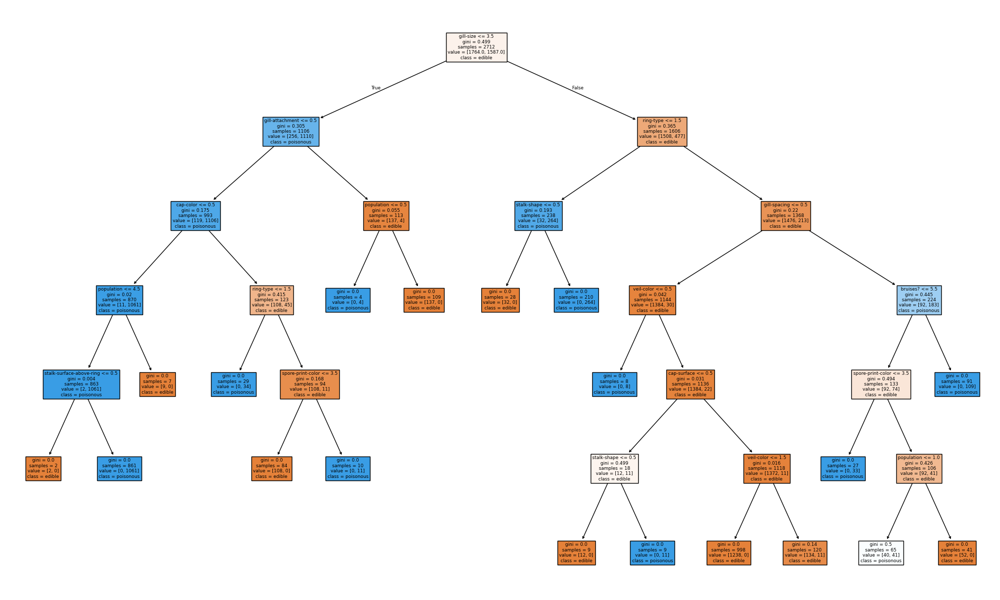

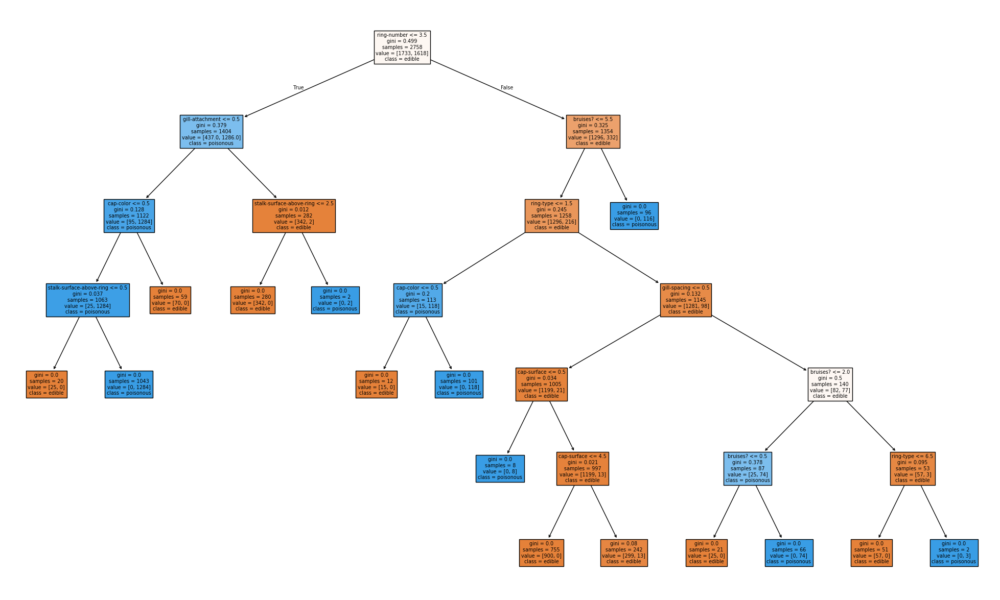

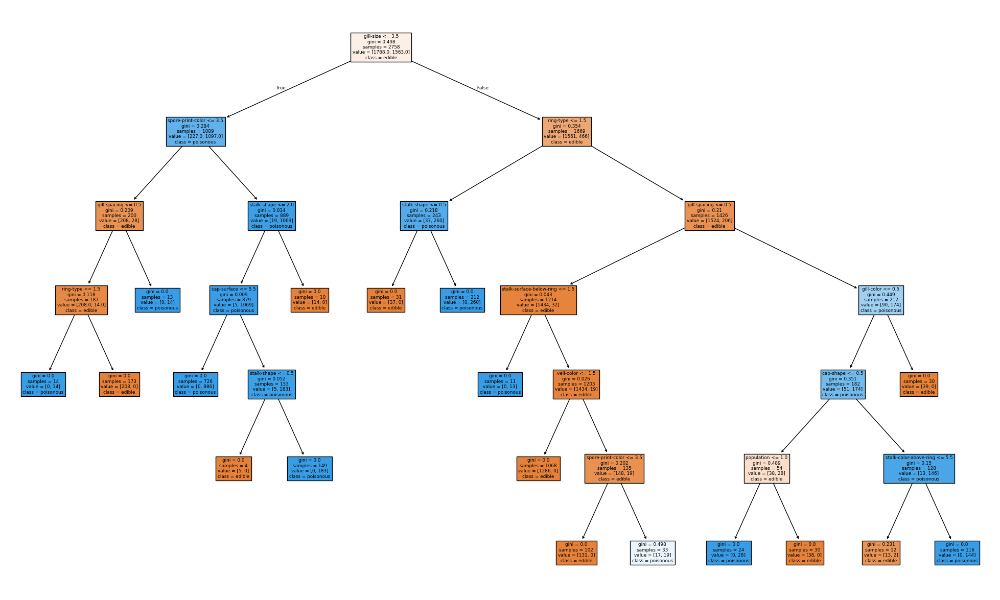

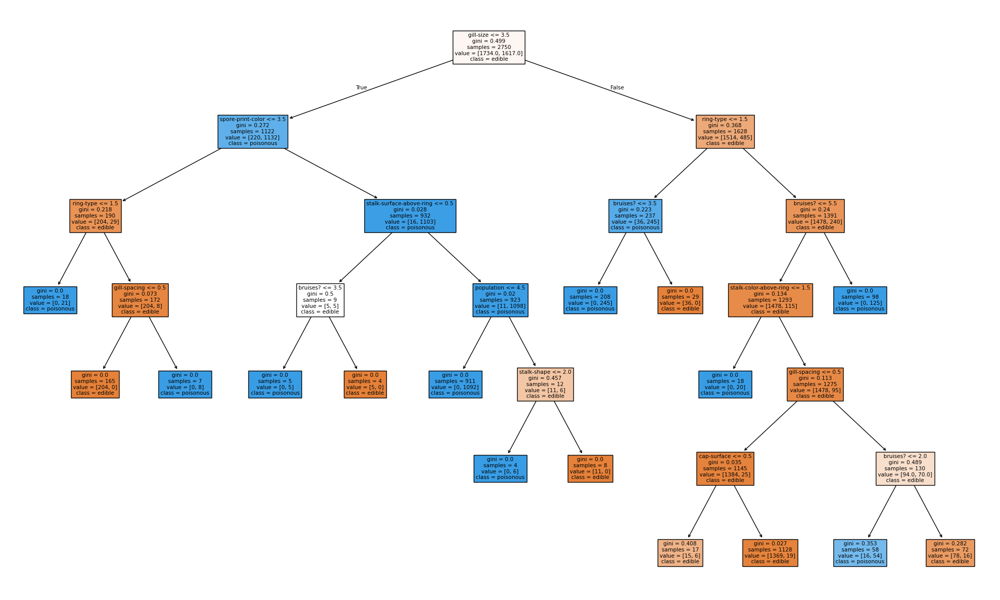

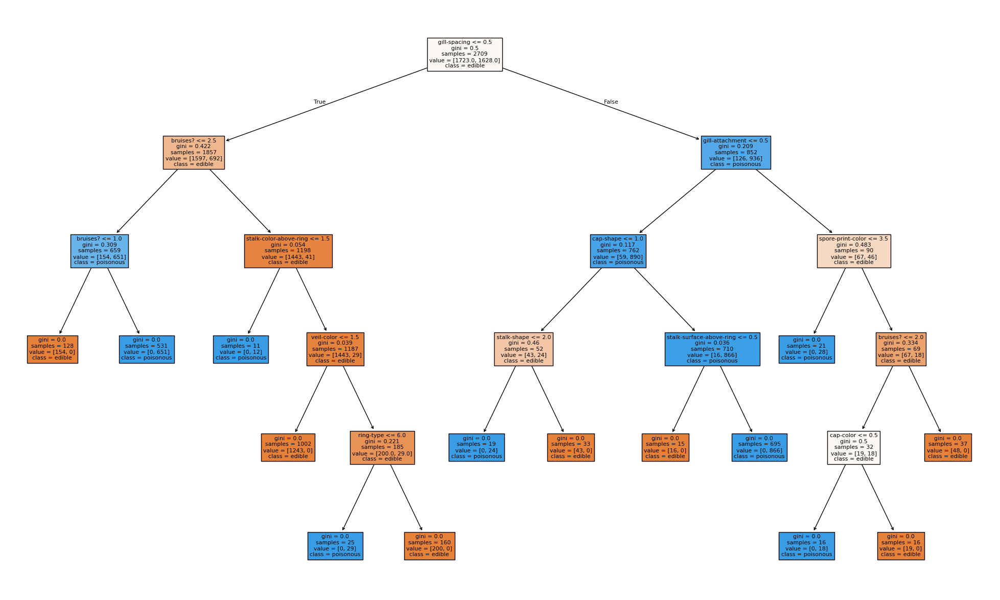

...

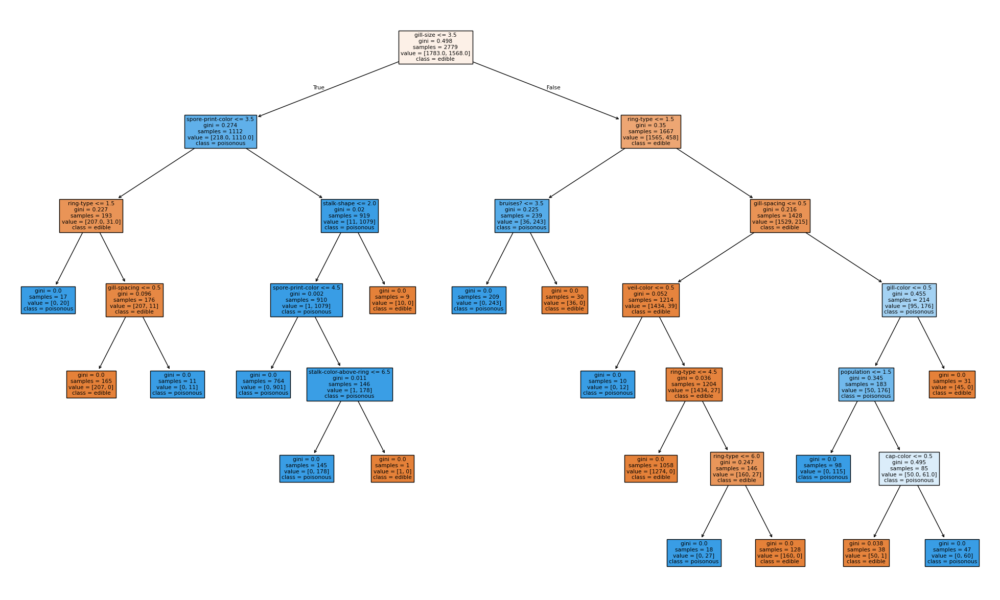

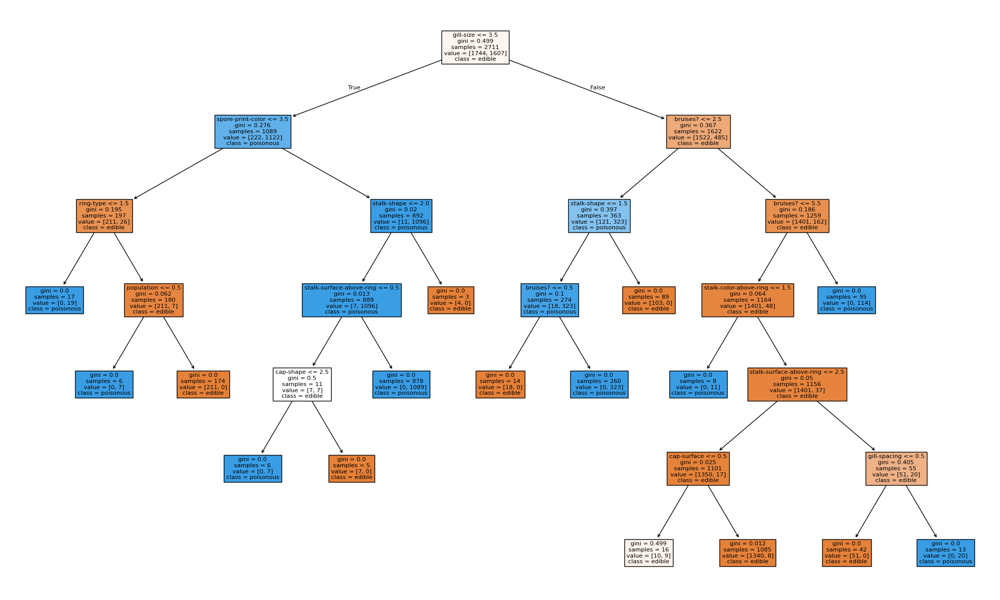

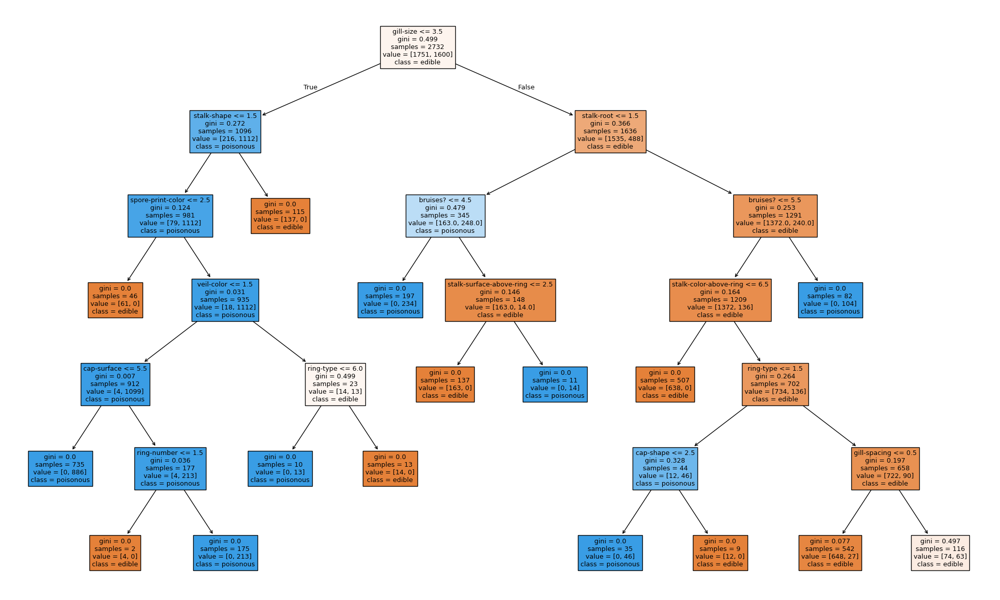

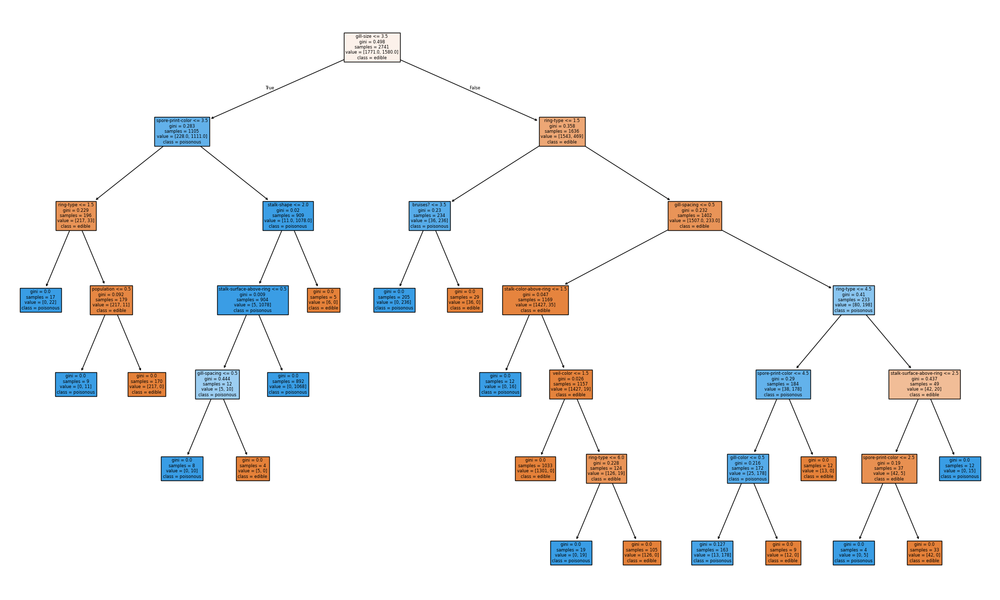

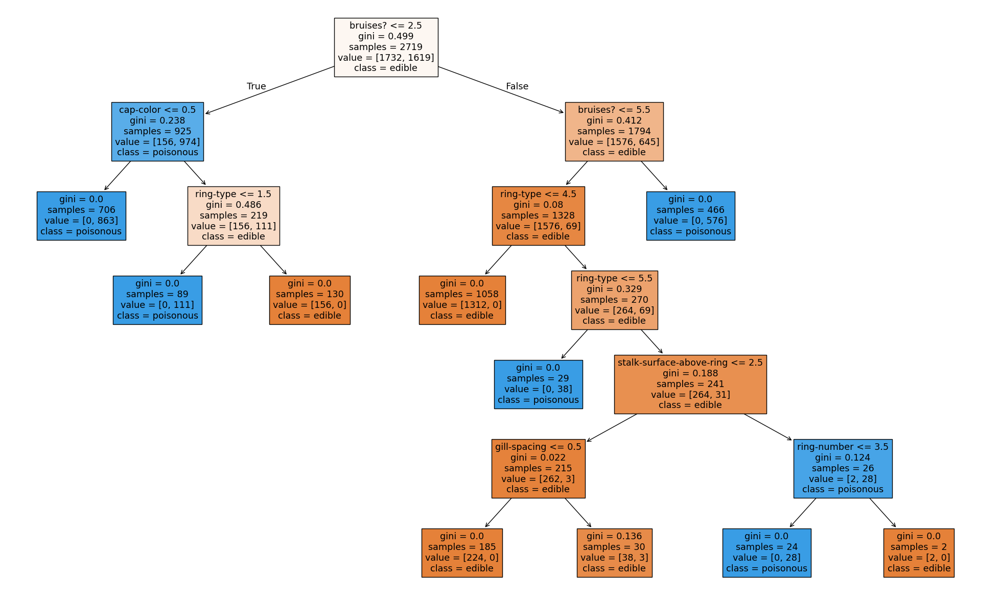

In [17]:
# for arbol in bosque.estimators_:
#     plt.figure(figsize=(25, 15))
#     tree.plot_tree(arbol, feature_names=numerical_dataset.columns[:-1], class_names=["edible", "poisonous"], filled=True)
#     plt.show()